# Airbnb New York City Rent Prediction Project
#### - Jiaqi Zhou

This project uses an open dataset of NYC listings in October, 2020 from Airbnb website and aims to predict daily rental price. Pricing properties can be a headache for new hosts who are not familiar with the house renting market, but our predictive model will give them a fair market price to refer to after information of property type, number of bedrooms, neighbourhood, etc. is provided. Since the dataset is only for October, the price provided may be only suitable for October or early November. There are seasonal changes in price, but if the model is trained on the data of November for example, the predicted price will capture the changes, so let's first try to build models based on our October data.

# Briefly investigating the data

In [1]:
# Import libraries
import pandas as pd
import numpy as np
from scipy import stats
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Import dataset
df = pd.read_csv("listings.csv")

The dataset includes the following 74 columns. It has 44666 observations in total.

In [3]:
df.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_upd

In [4]:
df.shape

(44666, 74)

After examining each column, we found that the following columns are uninformative in building predictive models. Information about hosts such as id and name is irrelevant to the pricing decision, so we exclude all the information of hosts. We also have columns that contains NAs only (license, bathrooms and calendar_updated), so we remove them as well. For neighbourhood_cleansed, it is not as specific as latitude and longitude, thus we cut it off.

In [5]:
# Drop useless columns
df = df.drop(['listing_url','scrape_id',
               'picture_url', 'host_id', 'host_url','host_name','host_location',
              'host_about','host_thumbnail_url','calendar_updated','calendar_last_scraped',"bathrooms",
              'license',"neighbourhood","neighbourhood_cleansed","host_neighbourhood","last_scraped","host_picture_url",
             "host_since","host_response_rate","host_response_time","host_acceptance_rate","calculated_host_listings_count",
              "calculated_host_listings_count_entire_homes","calculated_host_listings_count_private_rooms",
              "calculated_host_listings_count_shared_rooms",
             "host_identity_verified","host_has_profile_pic","host_is_superhost","host_listings_count"
              ,'host_listings_count',"host_total_listings_count","host_verifications"], axis = 1)


In [6]:
df.shape

(44666, 42)

### Drop information regarding reviews

Reviews need to be dropped because future information shouldn't be used to predict present price.

In [7]:
df = df.drop(['number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d',
              "review_scores_rating","review_scores_accuracy","review_scores_cleanliness",
    "review_scores_checkin","review_scores_communication",
              "review_scores_location","review_scores_value",
             "first_review","last_review","reviews_per_month"], axis = 1)

Let's take a look at how many missing values we have.

In [8]:
df.shape


(44666, 29)

In [9]:
df.isnull().sum()

id                                  0
name                               16
description                      1281
neighborhood_overview           16459
neighbourhood_group_cleansed        0
latitude                            0
longitude                           0
property_type                       0
room_type                           0
accommodates                        0
bathrooms_text                     90
bedrooms                         4259
beds                              513
amenities                           0
price                               0
minimum_nights                      0
maximum_nights                      0
minimum_minimum_nights              6
maximum_minimum_nights              6
minimum_maximum_nights              6
maximum_maximum_nights              6
minimum_nights_avg_ntm              6
maximum_nights_avg_ntm              6
has_availability                    0
availability_30                     0
availability_60                     0
availability

The majority of NAs is in bedrooms. We will fill them later.

# Part I: EDA & Data Cleaning

## Explore numeric features

Firstly, we examine numeric features. We will make visualization for each variable and then handle the null values.

### price

In [10]:
df["price"].head()

0    $175.00
1     $76.00
2     $60.00
3    $175.00
4     $73.00
Name: price, dtype: object

In [11]:
# Clean "price" column
df["price"] = df["price"].str.replace("$","").str.replace(",","").astype('float')

In [12]:
df["price"].describe()

count    44666.000000
mean       150.104657
std        323.366748
min          0.000000
25%         64.000000
50%        100.000000
75%        160.000000
max      10000.000000
Name: price, dtype: float64

In [13]:
 df = df[df["price"]<1500]

We drop extreme prices that are greater than $1500 since they are not maintream rent prices and would introduce bias to our models.

In [14]:
df[df["price"] == 0 ][["description","name","property_type"]]

,description,name,property_type
20430,NaN,the best you can find,Entire apartment
35426,Primo Midtown spot just 2 blocks from the worl...,Hotel near Empire State Building-Superior 2 Qu...,Room in boutique hotel
35427,Primo Midtown spot just 2 blocks from the worl...,"Big Room, Terrace with a view of Empire State ...",Room in boutique hotel
35429,Primo Midtown spot just 2 blocks from the worl...,"Private room, King Bed, walk to Macy's and MSG",Room in boutique hotel
35430,Primo Midtown spot just 2 blocks from the worl...,Sleep 4 in this Private room near Midtown Macy's!,Room in boutique hotel
39310,NaN,The James New York - NoMad,Room in boutique hotel
39311,NaN,Gardens Suites Hotel by Affinia,Room in hotel
39369,NaN,Lyric At 70 Pine,Room in boutique hotel
39723,NaN,Hotel Five44,Room in hotel
39724,NaN,Cassa Hotel NY 45th Street,Room in boutique hotel


It seems listings with price = 0 are fake listings, so we remove them from our data.

In [15]:
df = df[df["price"] != 0]

Let's visualize our price with distribution and Q-Q plots.

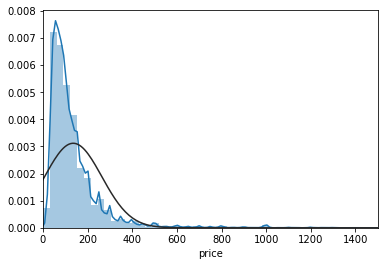

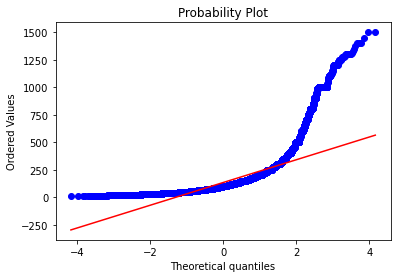

In [16]:
fig, ax = plt.subplots()
sns.distplot(df["price"], np.linspace(0, 1500, 50),fit = stats.norm)
plt.xlim(0, 1500)
plt.show()
res = stats.probplot(df['price'], plot=plt)

Price is right skewed, so we may need to log transform it to make it more normally distributed. One of the assumptions of applying linear regression is that the target variable is normally distributed for any fixed dependent variable, so if we want to better fit a linear model on our data, we need to log transform price. We add a new column corresponding to the log transformed price.

In [17]:
df["log_p"] = np.log1p(df["price"])

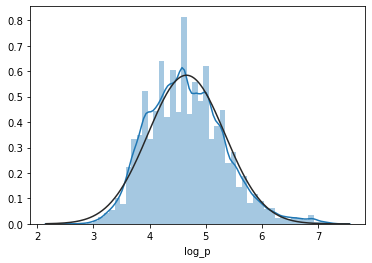

In [18]:
sns.distplot(df["log_p"], fit = stats.norm)
plt.show()

### bedrooms, beds & accommodates

In [19]:
df[["accommodates","bedrooms", "beds"]].head(5)

,accommodates,bedrooms,beds
0,2,NaN,1.0
1,3,1.0,3.0
2,2,1.0,1.0
3,4,2.0,2.0
4,2,1.0,1.0


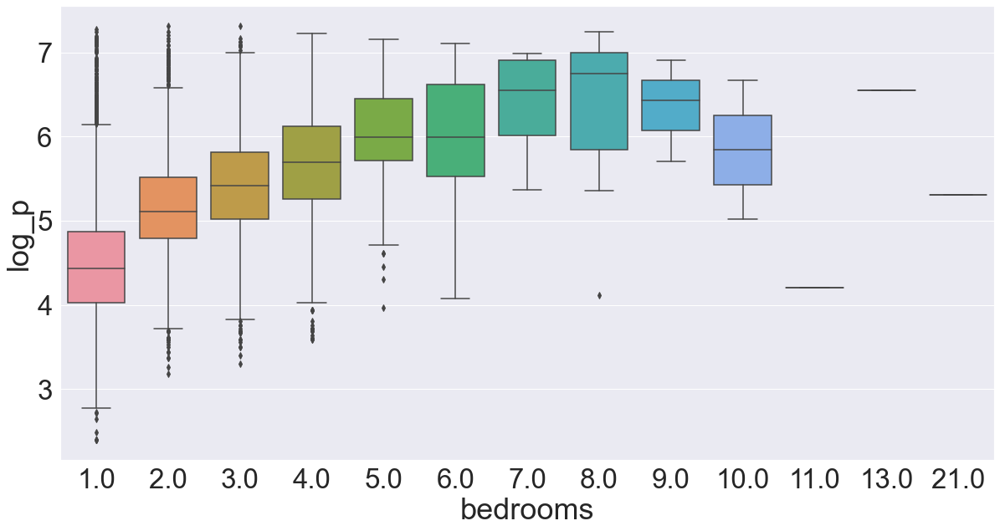

In [20]:
sns.set(font_scale=3)
fig, axs = plt.subplots()
fig.set_size_inches(20, 10)
sns.boxplot(x = df["bedrooms"],y = df["log_p"])
#axs[0].tick_params(labelrotation=90)
#sns.boxplot(ax = axs[1],x = df["beds"],y = df["log_p"])
#sns.boxplot(ax = axs[2],x = df["accommodates"],y = df["log_p"])

plt.show()

Drop listings with 0 bed. It appears that the above three variables have a linear relationship with price.

In [21]:
df = df[df["beds"] != 0]

In [22]:
df[["accommodates","bedrooms", "beds"]].corr()

,accommodates,bedrooms,beds
accommodates,1.000000,0.727753,0.766839
bedrooms,0.727753,1.000000,0.738367
beds,0.766839,0.738367,1.000000


"accommadates", "bedrooms" and "beds" all show some correlation with "log_p", so we keep them. Next, deal with the missing values.

In [23]:
df[["accommodates","bedrooms", "beds"]].isnull().sum()

accommodates       0
bedrooms        3886
beds             490
dtype: int64

There are some NAs in "bedrooms" and "beds", especially in "bedrooms". The number of missing values in "beds" is small so we drop those observations. Then for "bedrooms", we use "accommodates" and "beds" to estimate its missing values since the correlation coefficients among them are pretty large, around 0.7. Let's try to use linear, random forest and decision tree models and select the best one for imputation.

In [24]:
df = df[~df["beds"].isnull()]

In [25]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
df_notnans = df[df[["bedrooms","beds","accommodates"]].notnull().all(axis=1)][["bedrooms","beds","accommodates"]]
X_train, X_test, y_train, y_test = train_test_split(df_notnans[["accommodates","beds"]], df_notnans["bedrooms"],
                                                    train_size=0.75,
                                                    random_state=4)
reg = LinearRegression().fit(X_train, y_train)
# Fit on the train data
score = reg.score(X_train, y_train)
print("The prediction score on the train data is {:.2f}%".format(score*100))



The prediction score on the train data is 60.44%


In [26]:
from sklearn.ensemble import RandomForestRegressor
regr = RandomForestRegressor(max_depth=2, random_state=0)
regr.fit(X_train, y_train)
score = regr.score(X_train, y_train)
print("The prediction score on the train data is {:.2f}%".format(score*100))


The prediction score on the train data is 56.46%


In [27]:
from sklearn.tree import DecisionTreeRegressor
regr_1 = DecisionTreeRegressor(max_depth=2)
regr_1.fit(X_train, y_train)
score = regr_1.score(X_train, y_train)
print("The prediction score on the train data is {:.2f}%".format(score*100))


The prediction score on the train data is 54.49%


The linear regression model is better, so we use it to impute the missing values. We make a new column "bedrooms_pred" for replacing the missing values with predicted values, and we also fill the missing values in our original column with the average. We will compare the performance of model using "bedroom_pred" with the one using "bedrooms". 

In [28]:
score_1 = reg.score(X_test, y_test)
print("The prediction score on the test data is {:.2f}%".format(score_1*100))
# Fill NA in "bedrooms"
nanbedroom = df[~df[["bedrooms","beds","accommodates"]].notnull().all(axis=1)][["bedrooms","beds","accommodates"]]
nanbedroom["bedrooms"] = reg.predict(nanbedroom[["accommodates","beds"]]).round()
df["bedrooms_pred"] = df["bedrooms"].fillna(nanbedroom["bedrooms"]) 
df["bedrooms"] = df["bedrooms"].fillna(df["bedrooms"].mean()) 

The prediction score on the test data is 61.00%


### minimum_minimum_nights, maximum_minimum_nights, minimum_maximum_nights, maximum_maximum_nights, minimum_nights_avg_ntm & maximum_nights_avg_ntm

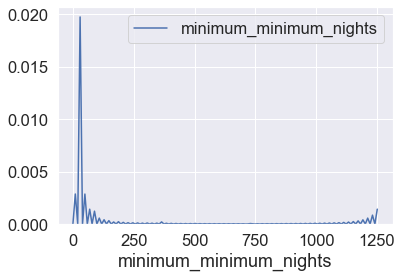

In [29]:
sns.set(font_scale=1.5)
sns.distplot(df["minimum_minimum_nights"], hist=False, hist_kws=dict(ec='w'), label='minimum_minimum_nights')

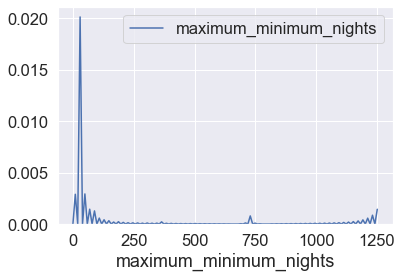

In [30]:
sns.distplot(df["maximum_minimum_nights"], hist=False, hist_kws=dict(ec='w'), label='maximum_minimum_nights');

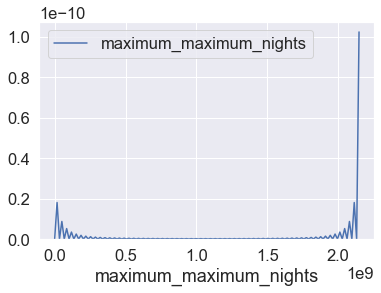

In [31]:
sns.distplot(df["maximum_maximum_nights"], hist=False, hist_kws=dict(ec='w'), label='maximum_maximum_nights');

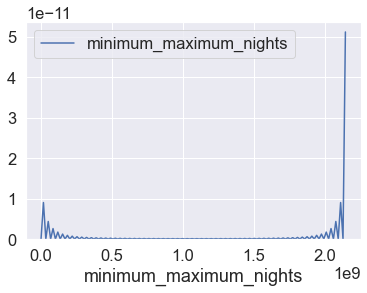

In [32]:
sns.distplot(df["minimum_maximum_nights"], hist=False, hist_kws=dict(ec='w'), label='minimum_maximum_nights')

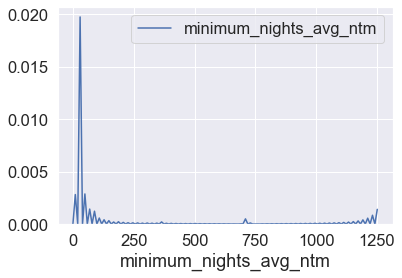

In [33]:
sns.distplot(df["minimum_nights_avg_ntm"], hist=False, hist_kws=dict(ec='w'), label='minimum_nights_avg_ntm')

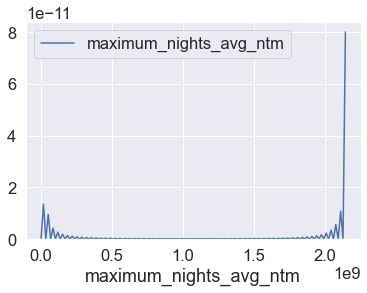

In [34]:
sns.distplot(df["maximum_nights_avg_ntm"], hist=False, hist_kws=dict(ec='w'), label='maximum_nights_avg_ntm')

In [35]:
df[["minimum_minimum_nights", "maximum_minimum_nights",
    "minimum_maximum_nights","maximum_maximum_nights",
    "minimum_nights_avg_ntm", "maximum_nights_avg_ntm","price","log_p"]].corr()

,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,price,log_p
minimum_minimum_nights,1.000000,0.536261,-0.006481,-0.009196,0.548378,-0.008992,0.026728,0.020490
maximum_minimum_nights,0.536261,1.000000,-0.004759,-0.006708,0.998605,-0.006558,0.076533,0.092090
minimum_maximum_nights,-0.006481,-0.004759,1.000000,0.706924,-0.004736,0.724362,0.031266,0.028857
maximum_maximum_nights,-0.009196,-0.006708,0.706924,1.000000,-0.006713,0.977992,0.045726,0.040663
minimum_nights_avg_ntm,0.548378,0.998605,-0.004736,-0.006713,1.000000,-0.006565,0.076007,0.091175
maximum_nights_avg_ntm,-0.008992,-0.006558,0.724362,0.977992,-0.006565,1.000000,0.046755,0.041012
price,0.026728,0.076533,0.031266,0.045726,0.076007,0.046755,1.000000,0.860347
log_p,0.020490,0.092090,0.028857,0.040663,0.091175,0.041012,0.860347,1.000000


The above 6 variables only display two distribution patterns, so we only keep two of them with disparate distributions. 

In [36]:
df = df.drop(["maximum_minimum_nights","minimum_maximum_nights",
     "minimum_nights_avg_ntm", "maximum_nights_avg_ntm"],axis = 1)

### availability_30, availability_60, availability_90 & availability_365

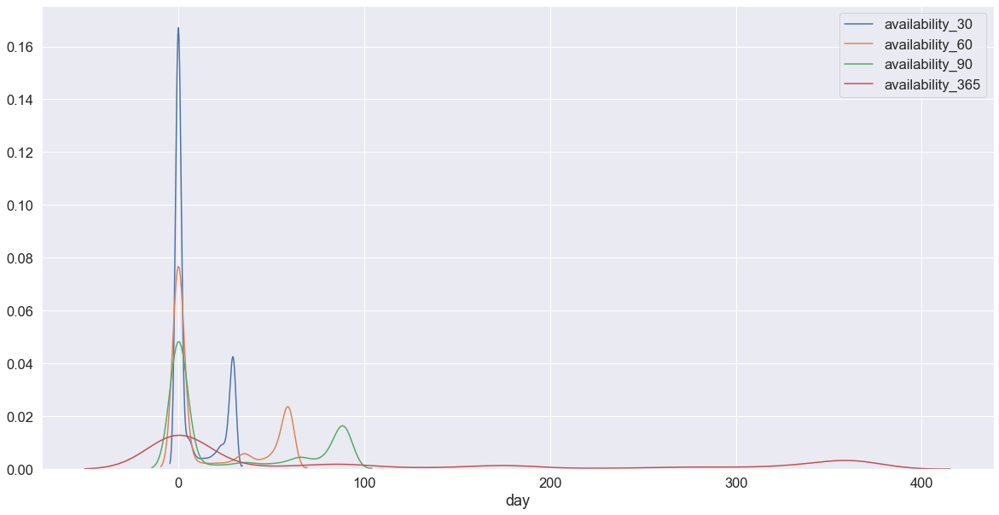

In [37]:
plt.figure(figsize=(20,10))
sns.distplot(df["availability_30"], hist=False, hist_kws=dict(ec='w'), label='availability_30')
sns.distplot(df["availability_60"], hist=False, hist_kws=dict(ec='w'), label="availability_60");
sns.distplot(df["availability_90"], hist=False, hist_kws=dict(ec='w'), label="availability_90");
sns.distplot(df["availability_365"], hist=False, hist_kws=dict(ec='w'), label="availability_365");
plt.xlabel("day")
plt.legend();


In [38]:
df[['availability_30','availability_60', 'availability_90',
       'availability_365',"price","log_p"]].corr()

,availability_30,availability_60,availability_90,availability_365,price,log_p
availability_30,1.000000,0.962398,0.924341,0.670222,0.073890,0.062749
availability_60,0.962398,1.000000,0.985252,0.733965,0.066952,0.054475
availability_90,0.924341,0.985252,1.000000,0.772995,0.067864,0.058145
availability_365,0.670222,0.733965,0.772995,1.000000,0.089424,0.077383
price,0.073890,0.066952,0.067864,0.089424,1.000000,0.860347
log_p,0.062749,0.054475,0.058145,0.077383,0.860347,1.000000


In [39]:
df[['availability_30','availability_60', 'availability_90',
       'availability_365']].isnull().sum()

availability_30     0
availability_60     0
availability_90     0
availability_365    0
dtype: int64

### Longitude & latitude

No handles with labels found to put in legend.


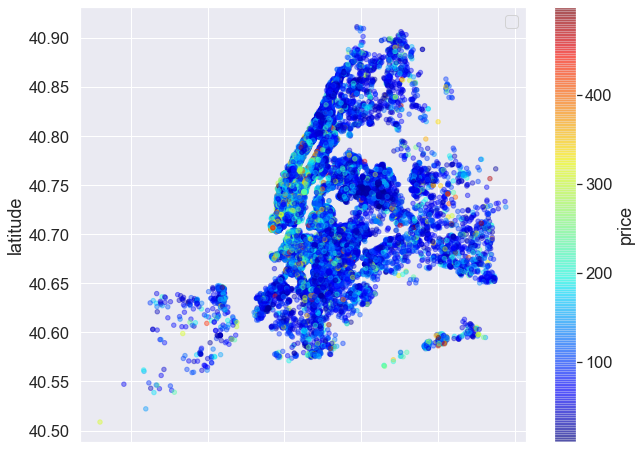

In [40]:
 
sub=df[df.price < 500]
heat=sub.plot(kind='scatter', x='longitude', y='latitude', c='price',
                  cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4, figsize=(10,8))

plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=10)
heat.legend()

## binary features

In [41]:
df[["has_availability","instant_bookable"]].head()

,has_availability,instant_bookable
0,t,f
1,t,f
2,t,f
3,t,f
4,t,f


In [42]:
df[["has_availability","instant_bookable"]].isnull().sum()

has_availability    0
instant_bookable    0
dtype: int64

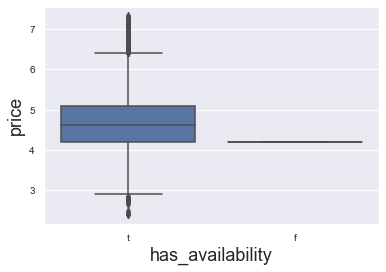

In [43]:
ax = sns.boxplot(x=df["has_availability"], y=np.log1p(df["price"]))
plt.show()


In [44]:
df[df["has_availability"] == "f"]["price"]

44298    65.0
Name: price, dtype: float64

All observations are "t" except one being "f", so we drop this column.

In [45]:
df = df.drop("has_availability", axis = 1)

### instant_bookable

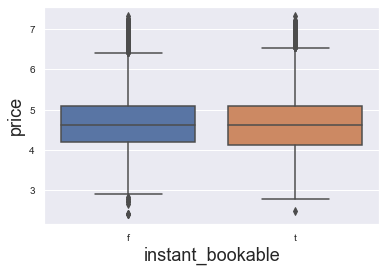

In [46]:
ax = sns.boxplot(x=df["instant_bookable"], y=np.log1p(df["price"]))
plt.show()


## Categorical Features

### bathrooms_text

In [47]:
df["bathrooms_text"].unique()

array(['1 bath', nan, '1.5 baths', '1 shared bath', '1 private bath',
       'Shared half-bath', '2 baths', '1.5 shared baths', '2.5 baths',
       '3 baths', 'Half-bath', '2 shared baths', '0 shared baths',
       '0 baths', '5 baths', '4.5 baths', '5.5 baths', '2.5 shared baths',
       '3.5 baths', 'Private half-bath', '6 baths', '4 baths',
       '3 shared baths', '8 shared baths', '4 shared baths',
       '3.5 shared baths', '6 shared baths', '6.5 shared baths',
       '5 shared baths', '4.5 shared baths', '7.5 baths',
       '5.5 shared baths', '8 baths'], dtype=object)

This column mingles numeric and categorical values together, so we need to seperate them.

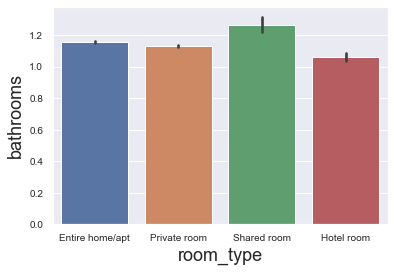

In [48]:
df["bathrooms"] = df["bathrooms_text"].str.replace("baths","").str.replace("shared","").str.replace("bath","").str.replace("private","")
df["bathrooms"] = df["bathrooms"].str.replace("Shared half-","0.5").str.replace("Private half-","0.5").str.replace("Half-","0.5").astype(float)
sns.barplot(x = "room_type",y = "bathrooms",data = df)
plt.show()

Create columns "bathrooms" and "bath_type" indicating the number of bathrooms and the type of bathrooms.

In [49]:
df["bathrooms"] = df["bathrooms"].fillna(1)
df["bathrooms_text"] = df["bathrooms_text"].fillna("1")

In [50]:
df[["bathrooms","price"]].corr()

,bathrooms,price
bathrooms,1.000000,0.285884
price,0.285884,1.000000


In [51]:
df["bath_type"] = np.nan
df["bath_type"]  = df[df["bathrooms_text"].str.contains("shared")]["bath_type"].fillna("shared")
df["bath_type"] = df["bath_type"].fillna("private")
df = df.drop(["bathrooms_text"], axis = 1)

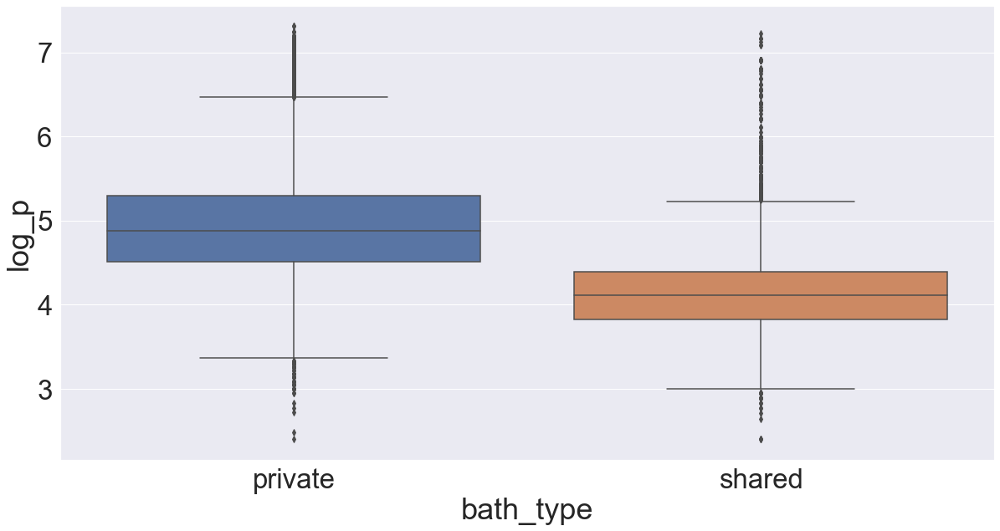

In [52]:
sns.set(font_scale=3)
plt.figure(figsize=(20,10))
ax = sns.boxplot(x=df["bath_type"], y=df["log_p"])
plt.show()

### room_type

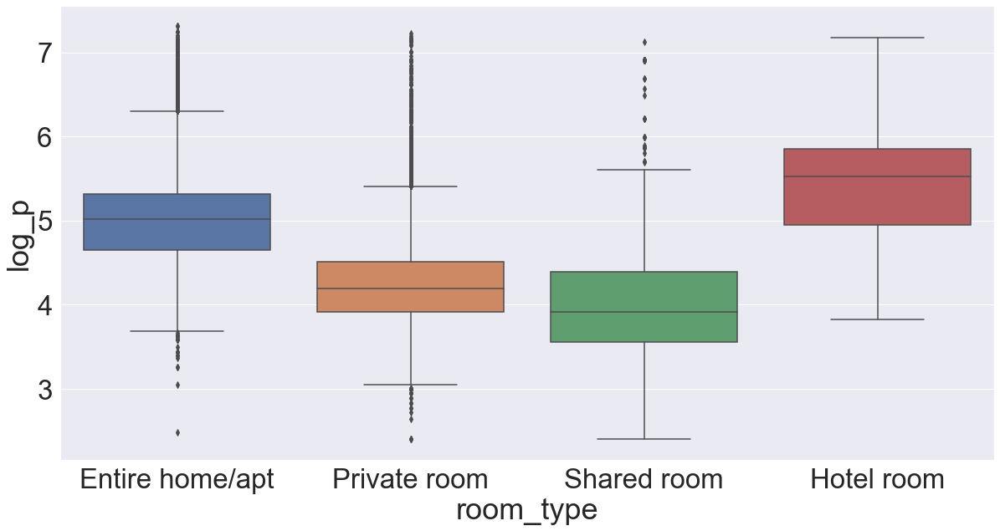

In [53]:
plt.figure(figsize=(20,10))
ax = sns.boxplot(x=df["room_type"], y=df["log_p"])
plt.show()

### property_type

In [54]:
df["property_type"].unique()

array(['Entire apartment', 'Entire guest suite',
       'Private room in apartment', 'Entire loft',
       'Private room in house', 'Private room in townhouse',
       'Entire townhouse', 'Entire condominium',
       'Private room in condominium', 'Private room in loft',
       'Entire house', 'Shared room in apartment',
       'Room in boutique hotel', 'Private room in guest suite',
       'Shared room in loft', 'Tiny house', 'Entire guesthouse',
       'Private room in cabin', 'Private room in bed and breakfast',
       'Shared room in house', 'Private room', 'Private room in hostel',
       'Entire place', 'Boat', 'Entire serviced apartment',
       'Shared room in earth house', 'Entire floor',
       'Private room in guesthouse', 'Room in serviced apartment',
       'Room in hostel', 'Entire cottage', 'Room in aparthotel',
       'Private room in villa', 'Entire villa', 'Entire resort',
       'Shared room', 'Private room in serviced apartment',
       'Room in hotel', 'Cave', 'Cas

In [55]:
len(df["property_type"].unique())

78

Since "room_type" specifies whether the listing is private, entire, shared, we no longer need this information in "property_type". Therefore, we clean them out.

In [56]:
def clean_property(str):
    df["property_type"] = df["property_type"].str.replace(str,"")
clean_property("Entire")
clean_property("Shared")
clean_property("in")
clean_property("Private")

In [57]:
df["property_type"].unique()

array([' apartment', ' guest suite', ' room  apartment', ' loft',
       ' room  house', ' room  townhouse', ' townhouse', ' condomium',
       ' room  condomium', ' room  loft', ' house',
       'Room  boutique hotel', ' room  guest suite', 'Ty house',
       ' guesthouse', ' room  cab', ' room  bed and breakfast', ' room',
       ' room  hostel', ' place', 'Boat', ' serviced apartment',
       ' room  earth house', ' floor', ' room  guesthouse',
       'Room  serviced apartment', 'Room  hostel', ' cottage',
       'Room  aparthotel', ' room  villa', ' villa', ' resort',
       ' room  serviced apartment', 'Room  hotel', 'Cave', 'Castle',
       ' room  floor', ' bungalow', 'Houseboat', ' room  bungalow',
       ' room  resort', ' room  castle', ' timeshare', ' home/apt',
       'Room  resort', ' room  -law', ' room  ty house', 'Camper/RV',
       ' room  tent', ' room  dome house', ' room  farm stay',
       ' room  casa particular', ' room  cave', ' room  dorm',
       ' room  barn'

Now we are left with the real property type, and we need to extract the property words such as house, apartment, hotel, etc. Those uncommon property types with counts of less than 10 are categorized as other.

In [58]:
def further_clean_property(str):
    df.loc[df["property_type"].str.contains(str,case=False), "property_type"] = str
further_clean_property("apartment")
df.loc[df["property_type"].str.contains("apt",case=False), "property_type"] = "apartment"
further_clean_property("guesthouse")
further_clean_property("hotel")
further_clean_property("hostel")
further_clean_property("loft")
further_clean_property("suit")
further_clean_property("villa")
further_clean_property("condomium")
further_clean_property("resort")
further_clean_property("castle")
further_clean_property("cave")
further_clean_property("cottage")
further_clean_property("barn")
further_clean_property("bungalow")
further_clean_property("townhouse")
further_clean_property("guesthouse")
further_clean_property("bed and breakfast")
further_clean_property("floor")
further_clean_property("boat")
df.loc[df["property_type"].str.contains("room  house",case=False), "property_type"] = "house"
df.loc[df["property_type"].str.contains(" house",case=False), "property_type"] = "house"
df.loc[df["property_type"].str.contains("room",case=False), "property_type"] = "other"
df.loc[df["property_type"].str.contains("Camper/RV",case=False), "property_type"] = "other"
df.loc[df["property_type"].str.contains("cottage",case=False), "property_type"] = "other"
df.loc[df["property_type"].str.contains("castle",case=False), "property_type"] = "other"
df.loc[df["property_type"].str.contains("barn",case=False), "property_type"] = "other"
df.loc[df["property_type"].str.contains("cave",case=False), "property_type"] = "other"
df.loc[df["property_type"].str.contains("Casa particular",case=False), "property_type"] = "other"
df.loc[df["property_type"].str.contains("timeshare",case=False), "property_type"] = "other"
df.loc[df["property_type"].str.contains("Lighthouse",case=False), "property_type"] = "house"

In [59]:
df["property_type"].value_counts()

apartment            33306
house                 3263
townhouse             1660
condomium             1523
loft                  1087
hotel                  714
suit                   368
hostel                 100
other                   75
resort                  67
guesthouse              64
bed and breakfast       51
 place                  36
bungalow                25
villa                   23
floor                   16
boat                    13
Name: property_type, dtype: int64

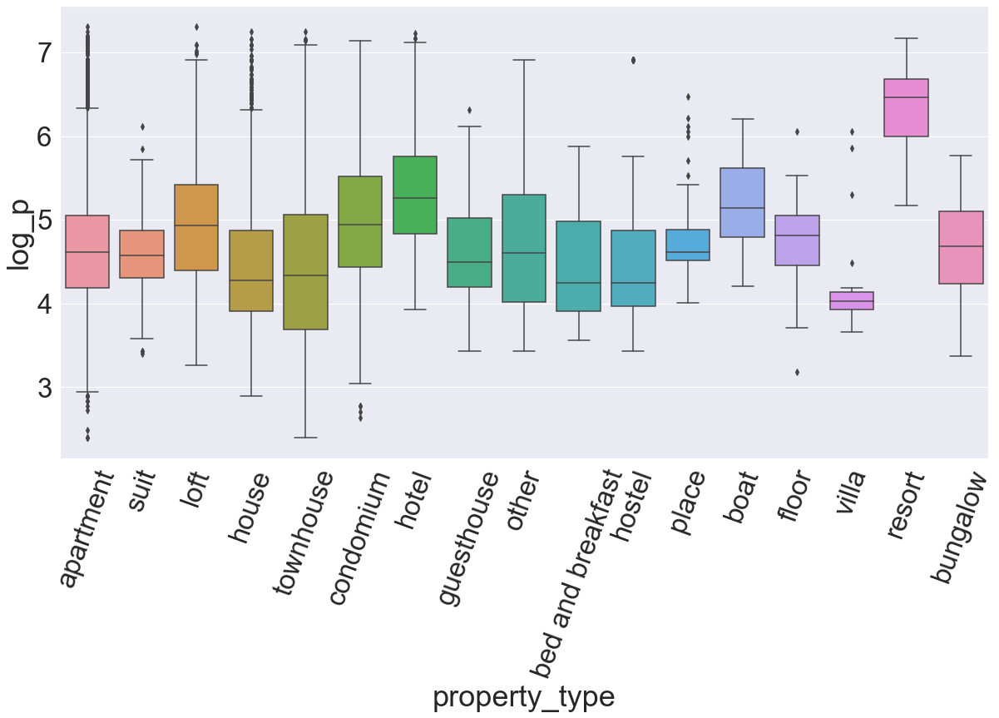

In [60]:

plt.figure(figsize=(20,10))
ax = sns.boxplot(x=df["property_type"], y=df["log_p"])
plt.xticks(rotation=70)
plt.rc('xtick', labelsize=15) 
plt.rc('ytick', labelsize=15)
plt.show()

### neighbourhood_group_cleansed

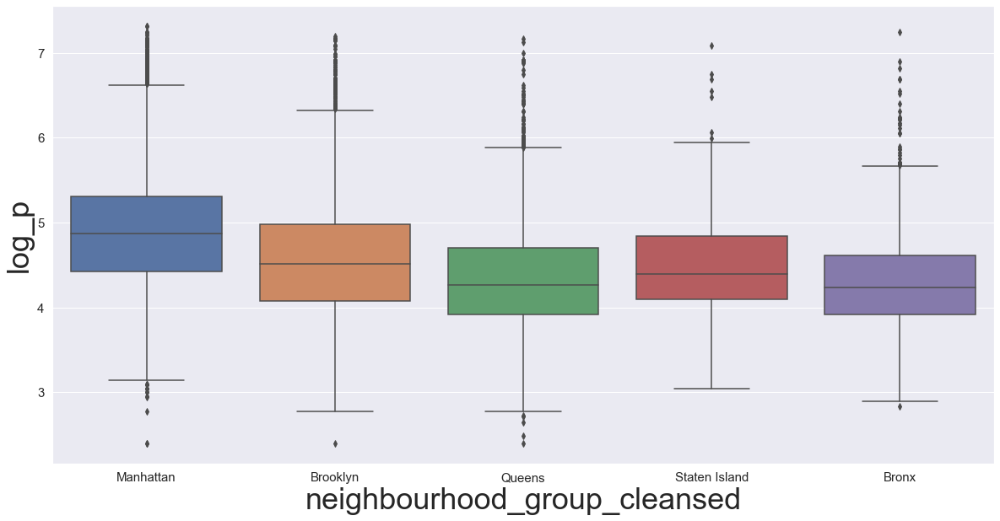

In [61]:
plt.figure(figsize=(20,10))
ax = sns.boxplot(x=df["neighbourhood_group_cleansed"], y=df["log_p"])
plt.show()

In [62]:
df.isnull().sum()

id                                  0
name                               14
description                      1056
neighborhood_overview           15376
neighbourhood_group_cleansed        0
latitude                            0
longitude                           0
property_type                       0
room_type                           0
accommodates                        0
bedrooms                            0
beds                                0
amenities                           0
price                               0
minimum_nights                      0
maximum_nights                      0
minimum_minimum_nights              0
maximum_maximum_nights              0
availability_30                     0
availability_60                     0
availability_90                     0
availability_365                    0
instant_bookable                    0
log_p                               0
bedrooms_pred                       0
bathrooms                           0
bath_type   

## Gather text data together

In [63]:

text_data = pd.DataFrame(df[["name","description","neighborhood_overview","amenities"]])
df = df.drop(["name","description","neighborhood_overview","amenities"], axis = 1)


In [64]:
df.to_csv('listings_clean.csv', index=False)
text_data.to_csv("text.csv", index = False)

# Part II: Feature Engineering

### Make dummies for "instant_bookable"

In [65]:
def convert_binary_column_dummy(column,df):
    df[column] = df[column].str.replace("t","1").str.replace("f","0").astype(int)
convert_binary_column_dummy("instant_bookable",df)


### One-hot encode "bath_type"

In [66]:
df["bath_type"] = df["bath_type"].str.replace("private","1").str.replace("shared","0").astype(int)

### One-hot encode "room_type", "property_type" & "neighbourhood_group_cleansed"

In [67]:
df = pd.get_dummies(df)

In [68]:
df.dtypes

id                                              int64
latitude                                      float64
longitude                                     float64
accommodates                                    int64
bedrooms                                      float64
beds                                          float64
price                                         float64
minimum_nights                                  int64
maximum_nights                                  int64
minimum_minimum_nights                        float64
maximum_maximum_nights                        float64
availability_30                                 int64
availability_60                                 int64
availability_90                                 int64
availability_365                                int64
instant_bookable                                int32
log_p                                         float64
bedrooms_pred                                 float64
bathrooms                   

In [69]:
df.isnull().sum()

id                                            0
latitude                                      0
longitude                                     0
accommodates                                  0
bedrooms                                      0
beds                                          0
price                                         0
minimum_nights                                0
maximum_nights                                0
minimum_minimum_nights                        0
maximum_maximum_nights                        0
availability_30                               0
availability_60                               0
availability_90                               0
availability_365                              0
instant_bookable                              0
log_p                                         0
bedrooms_pred                                 0
bathrooms                                     0
bath_type                                     0
neighbourhood_group_cleansed_Bronx      

# Part III: Building Models

## Building a baseline model with LASSO

We use LASSO to deal with multicollinearity and select powerful features. It is crucial to normalize our features before fitting LASSO regression. Firstly, let's  see if there is a difference between using "bedrooms" and "bedrooms_pred".

In [70]:
from sklearn.linear_model import LassoCV

In [71]:
def mse(y, yhat):
    return np.mean((y - yhat)**2)

def rmse(y, yhat):
    return mse(y, yhat)**0.5


In [72]:
models = {}
rmse_scores = []
mae_scores = []
r_squared = []

In [73]:
# Model with simple imputation
from sklearn import preprocessing
from sklearn.metrics import mean_absolute_error
y = df.price

keep_cols1 = [x for x in df.columns.values if x not in ["bedrooms_pred","id","price","log_p"]]
X1 = df[keep_cols1]
X1_train, X1_test, y_train, y_test = train_test_split(X1, y,train_size=0.8, random_state=4)
clf1 = LassoCV(cv=5,max_iter = 10000)
X1_scaled = preprocessing.scale(X1_train)
clf1.fit(X1_scaled, y_train)
y_pred = clf1.predict(X1_scaled)
rmse_scores.append(rmse(y_pred, y_train))
mae_scores.append(mean_absolute_error(y_train,y_pred))
r_squared.append(clf1.score(X1_scaled, y_train))
print(rmse(y_pred, y_train))
print(mean_absolute_error(y_train,y_pred))
models["Lasso with simple imputation"] = clf1


100.08449112499079
55.06778648078089


In [74]:
# Model with predicted bedrooms
keep_cols2 = [x for x in df.columns.values if x not in ["bedrooms","id","price","log_p"]]
X2 = df[keep_cols2]
X2_train, X2_test, y_train, y_test = train_test_split(X2, y,train_size=0.8, random_state=4)
clf2 = LassoCV(cv=5,max_iter = 10000)
X2_scaled = preprocessing.scale(X2_train)
clf2.fit(X2_scaled, y_train)
y_pred = clf2.predict(X2_scaled)
rmse_scores.append(rmse(y_pred, y_train))
mae_scores.append(mean_absolute_error(y_train,y_pred))
r_squared.append(clf2.score(X2_scaled, y_train))
print(rmse(y_pred, y_train))
print(mean_absolute_error(y_train,y_pred))
models["Lasso on price"] = clf2


100.03730367310091
54.99578600479906


The model with "bedrooms_pred" has a lower RMSE and MAE, so we consider our imputation method has improved the model. Then let's see if the linear model really fits our data.

### Residual Plot

In [75]:
import plotly.graph_objects as go
fig = go.Figure()
data_scatter = go.Scatter(x = y_pred, y = y_pred - y_train, mode = 'markers',  
                           line=dict(color='red'), name = 'residuals vs. fitted values')

fig.add_trace(data_scatter)
fig.update_layout(xaxis_title=r"Fitted Values",
                  yaxis_title="Residuals")


The residuals are clearly not randomly scattered, so the linear regression doesn't fit the data well. 

In [76]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = y_train, y = y_pred, mode = 'markers',  line=dict(color='red')))
fig.update_layout(xaxis_title = 'actual price', yaxis_title = 'predicted price')


Our model even predicts negative price. We need to fix this. Let's first try log transformation on our y to prevent negative fitted values.

In [77]:
# Model after log transformation
clf3 = LassoCV(cv=5,max_iter = 10000)
y3_train =  np.log1p(y_train)
X3_scaled = X2_scaled
clf3.fit(X3_scaled, y3_train)
y3_pred = clf3.predict(X3_scaled)
rmse_scores.append(rmse(np.expm1(y3_pred), np.expm1(y3_train)))
mae_scores.append(mean_absolute_error(np.expm1(y3_train),np.expm1(y3_pred)))
r_squared.append(clf3.score(X1_scaled, y3_train))
print(rmse(np.expm1(y3_pred), np.expm1(y3_train)))
print(mean_absolute_error(np.expm1(y3_train),np.expm1(y3_pred)))
models["Lasso on log_p"] = clf3


102.43343428558303
49.392031727518756


In [78]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = np.expm1(y3_train), y = np.expm1(y3_pred), mode = 'markers',  line=dict(color='red')))
fig.update_layout(xaxis_title = 'actual price', yaxis_title = 'predicted price')

In [79]:
fig = go.Figure()
bar = go.Bar(x = list(models.keys())[1:], y = mae_scores[1:], name="CV MAE")
fig.add_trace(bar)
fig.update_layout(xaxis_title=r"model",
                   yaxis_title="MAE")

In [80]:
fig = go.Figure()
bar = go.Bar(x = list(models.keys())[1:], y = r_squared[1:], name="$R^2$")
fig.add_trace(bar)
fig.update_layout(xaxis_title=r"model",
                   yaxis_title="$R^2$")

The above bar plot shows that the MAE decreased. After the log transformation, the $R^2$ improves drastically.

### Residual Plot

In [81]:

fig = go.Figure()

data_scatter = go.Scatter(x = np.expm1(y3_pred), y = np.expm1(y3_pred) - np.expm1(y3_train), mode = 'markers',  
                           line=dict(color='red'), name = 'residuals vs. fitted values')
fig.add_trace(data_scatter)
fig.update_layout(xaxis_title=r"Fitted Values",
                 yaxis_title="Residuals")

The residual plot still has some patterns in it, so linear regression model might still not be satisfying for price prediction even though we have log transformed the price.

In [82]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = np.expm1(y3_train), y = np.expm1(y3_pred), mode = 'markers',  line=dict(color='red')))
fig.update_layout(xaxis_title = 'actual price', yaxis_title = 'predicted price')


By taking the natual log of y, we successfully have gotten rid of the negative fitted values. To sum up, the regression model with $log(y)$ reduces the MAE and eliminates the negative predicted price, so we see it as an improvement.

# Adding more features

### amenities

We first try to improve our model by adding more features. We haven't examined "amenities" yet, and we can extract keywords from it to create new categorical features.

In [83]:
def parse(am_st):
    arr=am_st.split(',')
    am=[s.translate(s.maketrans('','','"')).strip() for s in arr if s!='']
    return(am)
text_data['amenities']=text_data.apply(lambda x:parse(x.amenities),axis=1)
from sklearn.preprocessing import MultiLabelBinarizer
mlb=preprocessing.MultiLabelBinarizer()
amenities=pd.DataFrame(mlb.fit_transform(text_data['amenities']),columns=mlb.classes_, index=df.index)
amenities.columns = [s.replace("[","") for s in amenities.columns]
amenities.columns = [s.replace("]","") for s in amenities.columns]
amenities = amenities.groupby(lambda x:x, axis=1).sum()

In [84]:
amenities = amenities.drop([""],axis = 1)

In [85]:
amenities.shape

(42391, 317)

In [86]:
df=pd.DataFrame(pd.concat([df,amenities],axis=1))

### Select powerful features with LASSO

We use LASSO regression with 5-fold cross validation to help us select powerful amenity features. 

In [87]:
clf4 = LassoCV(cv=5, max_iter = 10000)
y = df.log_p
keep_cols = [x for x in df.columns.values if x not in ["bedrooms_pred","id","price","log_p","longitude","latitude"]]
X = df[keep_cols]
X_train, X_test, y_train, y_test = train_test_split(X, y,train_size=0.8, random_state=4)
X_scaled = preprocessing.scale(X_train)
clf4.fit(X_scaled, y_train)
y_pred = clf4.predict(X_scaled)
rmse_scores.append(rmse(np.expm1(y_pred), np.expm1(y_train)))
mae_scores.append(mean_absolute_error(np.expm1(y_train),np.expm1(y_pred)))
r_squared.append(clf4.score(X_scaled, y_train))
print(rmse(np.expm1(y_pred), np.expm1(y_train)))
print(mean_absolute_error(np.expm1(y_train),np.expm1(y_pred)))
models["Lasso with amenity"] = clf4


99.91813202477283
47.60305483198983


Both the RMSE and MAE decreased after we included more features in our model.

In [88]:
fig = go.Figure()
bar = go.Bar(x = list(models.keys())[1:], y = mae_scores[1:], name="CV MAE")
fig.add_trace(bar)
fig.update_layout(xaxis_title=r"model",
                   yaxis_title="MAE")

In [89]:
kept = ~np.isclose(clf4.coef_, 0)
features = X.columns[kept]
print(len(features))
clf4.alpha_

216


0.0007512288211716222

In [90]:
len(X.columns)

357

LASSO selects 216 out of 357 features. The optimal hyperparameter produced by cross validation is 0.00075.

# Try esemble models

### Random Forest

In [91]:
from sklearn.ensemble import RandomForestRegressor

Since our data is quite large, it takes more than 10 minutes to train the random forest model without tuning the parameters. Therefore, we need to tune them straight on to speed the training process up. There are 6 parameters that need to be tuned:
- max_depth
- min_sample_split
- min_samples_leaf
- max_leaf_nodes
- n_estimators
- max_features
We use 10-fold cross validation to select the best parameter that produces the lowest RMSE/MAE on the validation set.

In [92]:
y = df.price
keep_cols = [x for x in df.columns.values if x not in ["bedrooms_pred","id","price","log_p","long\lat"]]
X = df[keep_cols]
X_train, X_test, y_train, y_test = train_test_split(X, y,train_size=0.8, random_state=4)

In [93]:
train_results = []
min_samples_split = [10, 50, 100, 150,200, 250]
for sam in min_samples_split:
    rf = RandomForestRegressor(n_estimators = 10, max_depth = 3,min_samples_split = sam, random_state=123)
    rf.fit(X_train, y_train)
    y_pred = rf.predict(X_train)
    train_results.append(rmse(y_pred, y_train))
train_results

[103.67410292502626,
 103.78199775258065,
 103.78199775258065,
 103.78199775258065,
 103.94938678698509,
 103.94938678698509]

min_samples_split doesn't affect the RMSE much, so we dont' tune this parameter.  

In [94]:
train_results = [] 
max_leaf_nodes = [10, 50, 100, 200]
for leaf in max_leaf_nodes:
    rf = RandomForestRegressor(n_estimators = 10, max_depth = 3,max_leaf_nodes = leaf, random_state=123)
    rf.fit(X_train, y_train)
    y_pred = rf.predict(X_train)
    train_results.append(rmse(y_pred, y_train))
train_results

[103.67410292502626,
 103.67410292502626,
 103.67410292502626,
 103.67410292502626]

This parameter doesn't seem to matter as well. We don't need to tune it.

In [95]:
train_results = []
min_samples_leaf = [1,5,10,50,100]
for leaf in min_samples_leaf:
    rf = RandomForestRegressor(n_estimators = 10, max_depth = 3,min_samples_leaf = leaf, random_state=123)
    rf.fit(X_train, y_train)
    y_pred = rf.predict(X_train)
    train_results.append(rmse(y_pred, y_train))
train_results

[103.67410292502626,
 103.67188125084294,
 103.84533920859403,
 104.79901706811906,
 105.05397859149525]

This parameter doesn't change much as we tune it. Therefore, we don't tune it.

In [96]:
def rmse_score(model, X, y):
    return np.sqrt(np.mean((y - model.predict(X))**2))

In [97]:
from sklearn.model_selection import cross_val_score
train_results = []
# Tuning  max_depth
n_depth = np.linspace(1, 10, 10)
for depth in n_depth:    
    rf = RandomForestRegressor(n_estimators = 10, max_depth = depth,random_state=123)
    score = cross_val_score(rf,X_train, y_train,cv=10,scoring=rmse_score)
    train_results.append(np.mean(score))
train_results

[116.94567782456934,
 108.88591263656136,
 104.18546484752187,
 99.62468491120356,
 96.90875188297117,
 94.84790535670837,
 93.10724227768578,
 92.18583885355025,
 91.38247495020748,
 90.81272068613]

When max depth gets to 7, the decrease in the RMSE slows down, and also it took way too long to run the code when depth is beyond 7, so we choose 7 as the optimal parameter.

In [101]:
train_results = []
# Tuning n_estimators
n_estimators = [20, 30, 40, 50, 80]
for est in n_estimators:
    rf = RandomForestRegressor(n_estimators = est, max_depth = 2,random_state=123)
    score = cross_val_score(rf,X_train, y_train,cv=10,scoring=rmse_score)
    train_results.append(np.mean(score))
train_results

KeyboardInterrupt: 

We can stop at 50 trees as increasing the number of trees doesn't significantly decrease the RMSE.

In [ ]:
train_results = []
max_features = [1,5,10,50,100,150,200]
for f in max_features: 
    rf = RandomForestRegressor(n_estimators = 10, max_depth = 3,max_features = f, random_state=123)
    rf.fit(X_train, y_train)
    score = cross_val_score(rf,X_train, y_train,cv=10,scoring=rmse_score)
    train_results.append(np.mean(score))
train_results

We will choose 150 to be max_features. Finally, we have tuned all the parameters. Now we compare the random forest model with Lasso.

In [102]:
rf = RandomForestRegressor(n_estimators = 50, max_depth = 7,max_features = 150, random_state=123)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_train)
rmse_scores.append(rmse(y_pred, y_train))
mae_scores.append(mean_absolute_error(y_train,y_pred))
r_squared.append(rf.score(X_train, y_train))
print(rmse(y_pred, y_train))
print(mean_absolute_error(y_train,y_pred))
models["Random forest with amenity"] = rf


85.93653706456634
47.13970899491391


In [103]:
fig = go.Figure()
bar = go.Bar(x = list(models.keys())[1:], y = mae_scores[1:], name="CV MAE")
fig.add_trace(bar)
fig.update_layout(xaxis_title=r"model",
                   yaxis_title="MAE")

In [104]:
fig = go.Figure()
bar = go.Bar(x = list(models.keys())[1:], y = rmse_scores[1:], name="CV RMSE")
fig.add_trace(bar)
fig.update_layout(xaxis_title=r"model",
                   yaxis_title="RMSE")

The random forest model has the lowest RMSE and MAE. Overall the random forest model is the best one so far.

## XGBoost

In [105]:
import xgboost as xgb

In [106]:
data_dmatrix = xgb.DMatrix(data=X,label=y)

In [107]:
xg_reg = xgb.XGBRegressor(objective ='reg:linear', seed = 123)

In [109]:
xg_reg.fit(X_train,y_train)

[20:09:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.2.0/src/objective/regression_obj.cu:174: reg:linear is now deprecated in favor of reg:squarederror.
[20:10:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.2.0/src/objective/regression_obj.cu:174: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1,
             objective='reg:linear', random_state=123, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=123, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [110]:
pred = xg_reg.predict(X_train)

In [111]:
print(rmse(pred,y_train))
print(mean_absolute_error(pred,y_train))

57.62835352132928
33.70908887140282


Without any tuning, the model gives us the RMSE of 57 and MAE of 33, which is the best result so far, but overfitting is likely. Hence, we need to tune the parameters to avoid overfitting. XGBoost has the following core parameters:
- max_depth: the maximum depth that a tree can grow to
- colsample_bylevel: the fraction of columns for each level
- min_child_weight: the minimum number of instances needed to be in each node
- n_estimators: the number of boosting stages to perform. 
- learning_rate: the rate that shrinks the feature weights

We will be only tuning them because they are the parameters that have impact on the accuracy of our model.

In [121]:
train_results = []
# Tuning max_depth
max_depth = [3,4,5,6,7,8]
for depth in max_depth:
    xg = xgb.XGBRegressor(max_depth = depth, random_state=123)
    score = cross_val_score(xg,X_train, y_train,cv=5,scoring=rmse_score)
    train_results.append(np.mean(score))
train_results


[86.74191262724162,
 85.3651483509826,
 85.14713262819897,
 85.52042536230375,
 86.21037086161733,
 87.21405757054718]

When max_depth is 5, the RMSE value is the lowest.

In [118]:
train_results = []
# Tuning n_estimators
n_estimators = [10, 20, 30, 40, 50, 80, 100]
for est in n_estimators:
    xg = xgb.XGBRegressor(n_estimators = est, random_state=123)
    score = cross_val_score(xg,X_train, y_train,cv=5,scoring=rmse_score)
    train_results.append(np.mean(score))
train_results

[88.98555159549917,
 86.46699756613403,
 85.83155905296395,
 85.59331447901816,
 85.4358228251393,
 85.33131626932692,
 85.52042536230375]

80 is appropriate because the RMSE doesn't go down much once it hits 50.

In [115]:
train_results = []
# Tuning learning_rate
learning_rate = [0.01,0.05, 0.1,0.3]

for rate in learning_rate:
    xg = xgb.XGBRegressor(learning_rate = rate, random_state=123)
    score = cross_val_score(xg,X_train, y_train,cv=5,scoring=rmse_score)
    train_results.append(np.mean(score))
train_results

[111.63633906033294, 85.98507898562187, 84.61918539840451, 85.52042536230375]

0.1 is the best choice, producing the lowest RMSE on validation set.

In [116]:
train_results = []
# Tuning min_child_weight
min_child_weight = [3,4,5,6,7]

for child in min_child_weight  :
    xg = xgb.XGBRegressor(min_child_weight = child, random_state=123)
    score = cross_val_score(xg,X_train, y_train,cv=5,scoring=rmse_score)
    train_results.append(np.mean(score))
train_results

[85.74320973275137,
 85.97494587759661,
 85.67871241348693,
 85.44596611353256,
 85.52497620122142]

6 is the best one.

In [117]:
train_results = []
# Tuning colsample_bylevel
colsample_bylevel = [0.3,0.4,0.5,0.6,0.7]

for level in colsample_bylevel :
    xg = xgb.XGBRegressor(colsample_bylevel  = level, random_state=123)
    score = cross_val_score(xg,X_train, y_train,cv=5,scoring=rmse_score)
    train_results.append(np.mean(score))
train_results

[85.51331626486488,
 85.64213439695538,
 85.31158029616357,
 85.17293129554757,
 85.3676084877591]

colsample_bylevel = 0.6 gives us the lowest RMSE. Now every parameter has been tuned, so let's build our XGBoost model.

In [126]:
xg = xgb.XGBRegressor(colsample_bylevel=0.6,
             learning_rate=0.1, max_depth= 5,
             min_child_weight=6,
             n_estimators=80)

In [127]:
xg.fit(X_train,y_train)
pred = xg.predict(X_train)
print(rmse(pred,y_train))
print(mean_absolute_error(pred,y_train))

77.94973409115237
41.53482780097031


In [128]:
models["XGBoost"] = xg
rmse_scores.append(rmse(pred, y_train))
mae_scores.append(mean_absolute_error(y_train,pred))
r_squared.append(xg.score(X_train, y_train))

In [129]:
fig = go.Figure()
bar = go.Bar(x = list(models.keys())[1:], y = mae_scores[1:], name="CV MAE")
fig.add_trace(bar)
fig.update_layout(xaxis_title=r"model",
                   yaxis_title="MAE")

In [130]:
fig = go.Figure()
bar = go.Bar(x = list(models.keys())[1:], y = rmse_scores[1:], name="RMSE")
fig.add_trace(bar)
fig.add_trace(go.Bar(x = list(models.keys())[1:], y = mae_scores[1:], name="MAE"))
fig.update_layout(xaxis_title=r"model",
                   yaxis_title="Error")

As it is shown above, XGBoost outperforms other models with its low RMSE as well as MAE. Therefore, we decide to use XGBoost for price prediction. It is finally the time to look at its performance on test set.

In [136]:
pred = xg.predict(X_test)
print(rmse(pred,y_test))
print(mean_absolute_error(pred,y_test))

80.72161874970276
42.87623038816402


In [132]:
fig = go.Figure()
bar = go.Bar(x = ["XGBoost on train","XGBoost on test"], y = [41.53482780097031,42.87623038816402], name="MAE")
fig.add_trace(bar)
fig.update_layout(xaxis_title=r"model",
                   yaxis_title="MAE")

In [133]:
fig = go.Figure()
bar = go.Bar(x = ["XGBoost on train","XGBoost on test"], y = [77.94973409115237,80.72161874970276], name="RMSE")

fig.add_trace(bar)
fig.add_trace(go.Bar(x = ["XGBoost on train","XGBoost on test"], y = [41.53482780097031,42.87623038816402], name="MAE"))
fig.update_layout(xaxis_title=r"model",
                   yaxis_title="Error")

The difference between RMSE and MAE scores on train and test sets are very small. Therefore, our model is appropriately tuned and there is no overfitting issue.

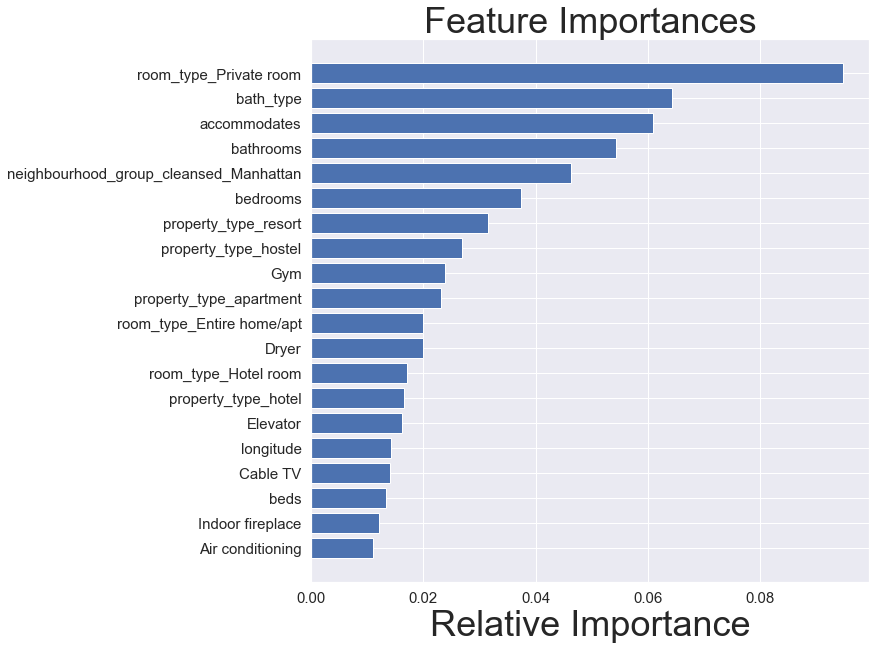

In [135]:

features = X_test.columns
importances = xg.feature_importances_
indices = np.argsort(importances)

# customized number 
num_features = 20 

plt.figure(figsize=(10,10))
plt.title('Feature Importances')

# only plot the customized number of features
plt.barh(range(num_features), importances[indices[-num_features:]], color='b', align='center')
plt.yticks(range(num_features), [features[i] for i in indices[-num_features:]])
plt.xlabel('Relative Importance')
plt.show()

The top 20 most important features are displayed above. Whether room type is private is the most important feature when it comes to rent price prediction.